# Orbit Final

* Last modified on 04-30-2023 by Aaron Woyshville (woyshville.1@osu.edu)



A Jupyter notebook that solves for and plots 2-body and 3-body orbital paths.<br /><br />
Force due to gravity is derived from the potential: <br />
$U(\mathbf{r_1}, \mathbf{r_2}) = -\large\frac{Gm_1m_2}{|\mathbf{r_1}-\mathbf{r_2}|}$<br /><br />
The radial distances for 3 bodies are given by:<br />
$r_{12} = \sqrt{(x_1-x_2)^2-(y_1-y_2)^2}$<br />
$r_{13} = \sqrt{(x_1-x_3)^2-(y_1-y_3)^2}$<br />
$r_{23} = \sqrt{(x_2-x_3)^2-(y_2-y_3)^2}$<br /><br />
To place the 2-body orbits in the CoM frame, the following transformations are used: <br />
$\mathbf{r_1} = \mathbf{R} + \large\frac{m_2}{M}\normalsize\mathbf{r}$ and $\mathbf{r_2} = \mathbf{R}  \large\frac{m_1}{M}\normalsize\mathbf{r}$
<br /><br />
In the CoM frame, the Kinetic Energy $T$ is given by:<br />
$T=\frac12M\mathbf{\dot R^2}+\frac12\mu\mathbf{\dot r^2},$ where $\mu$ is the reduced mass $\mu = \large\frac{m_1m_2}{M}\normalsize\equiv\large\frac{m_1m_2}{m_1+m_2}.$<br /><br />
Then the Lagrangian $\mathcal{L} = T - U$ for the CoM frame is:<br />
$\mathcal{L} = T - U = \frac12M\mathbf{\dot R^2} + (\frac12\mu\mathbf{\dot r^2} - U(r)) = \mathcal{L_{cm}}+\mathcal{L_{rel}}.$


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from matplotlib import animation, rc
from IPython.display import HTML

In [2]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

## Orbit Class and utility functions (2-body)

In [3]:
class Orbit:
    """
    Class to implement parameters and solve Lagrange's equations for two orbiting particles under gravity.
    
    Parameters
    ----------
    m1, m2: float
    Masses of planets/particles
    
    G: float
    Gravitational constant
    
    Methods
    -------
    dz_dt(t, z)
    Returns rhs of diffeq in vector z, given time t and corresponding cartesian coordinates.
    
    solve_ode(self, t_pts, z_0, abserr=1.0e-8, relerr=1.0e-8
    Standard scipy.integrate solver using RK23.
    
    solve_ode_Leapfrog(self, t_pts, z_0)
    Defines an ODE solver using the Leapfrog method.
    
    """
    
    def __init__(self, m1=1., m2=1., G=1.):
        """
        This function initializes the masses of 2 planets (m1, m2) and a gravitational constant (G).
        """
        self.m1 = m1
        self.m2 = m2
        self.G = G
        
    def dz_dt(self, t, z):
        """
        This function returns the rhs of the diffeq:
        [dz/dt d^2z/dt^2]
        
        Parameters
        ----------
        x1, x2, y1, y2: float
        Cartesian positional coordinates
        
        Returns
        -------
        xd1, xd2, yd1, yd2: float
        Cartesian velocity coordinates
        
        self.G*self.m1(x1-2)/r_12**3, ...
        Values of force due to gravitational attraction
        """
        x1, xd1, y1, yd1, x2, xd2, y2, yd2 = z        
        r_12 = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

        return [ \
                xd1, self.G * self.m2 * (x2-x1) / r_12**3, \
                yd1, self.G * self.m2 * (y2-y1) / r_12**3, \
                xd2, self.G * self.m1 * (x1-x2) / r_12**3, \
                yd2, self.G * self.m1 * (y1-y2) / r_12**3, \
               ]
    
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
        x1, xd1, y1, yd1, x2, xd2, y2, yd2 = solution.y
        return x1, xd1, y1, yd1, x2, xd2, y2, yd2
    
    def solve_ode_Leapfrog(self, t_pts, z_0):
        """
        Solve the ODE given initial conditions with the Leapfrog method.
        """
        delta_t = t_pts[1] - t_pts[0]
        
        x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0 = z_0
        
        # initialize the arrays with zeros
        num_t_pts = len(t_pts)
        
        x1 = np.zeros(num_t_pts)
        xd1 = np.zeros(num_t_pts)
        xd1_half = np.zeros(num_t_pts)
        
        y1 = np.zeros(num_t_pts)
        yd1 = np.zeros(num_t_pts)
        yd1_half = np.zeros(num_t_pts)
        
        x2 = np.zeros(num_t_pts)
        xd2 = np.zeros(num_t_pts)
        xd2_half = np.zeros(num_t_pts)
        
        y2 = np.zeros(num_t_pts)
        yd2 = np.zeros(num_t_pts)
        yd2_half = np.zeros(num_t_pts)
        
        # initial conditions
        
        x1[0] = x1_0
        xd1[0] = xd1_0
        
        y1[0] = y1_0
        yd1[0] = yd1_0
        
        x2[0] = x2_0
        xd2[0] = xd2_0
        
        y2[0] = y2_0
        yd2[0] = yd2_0
        
        # step through the differential equation
        for i in np.arange(num_t_pts - 1):
            t = t_pts[i]
            
            z = [x1[i], xd1[i], y1[i], yd1[i], x2[i], xd2[i], y2[i], yd2[i]]
            out = self.dz_dt(t,z)
            
            xd1_half[i] = xd1[i] + out[1] * delta_t/2.
            x1[i+1] = x1[i] + xd1_half[i] * delta_t
            
            yd1_half[i] = yd1[i] + out[3] * delta_t/2.
            y1[i+1] = y1[i] + yd1_half[i] * delta_t
            
            xd2_half[i] = xd2[i] + out[5] * delta_t/2.
            x2[i+1] = x2[i] + xd2_half[i] * delta_t
            
            yd2_half[i] = yd2[i] + out[7] * delta_t/2.
            y2[i+1] = y2[i] + yd2_half[i] * delta_t
            
            z = [x1[i+1], xd1[i], y1[i+1], yd1[i], x2[i+1], xd2[i], y2[i+1], yd2[i]]
            out = self.dz_dt(t,z)
        
            xd1[i+1] = xd1_half[i] + out[1] * delta_t/2.
            yd1[i+1] = yd1_half[i] + out[3] * delta_t/2.
            xd2[i+1] = xd2_half[i] + out[5] * delta_t/2.
            yd2[i+1] = yd2_half[i] + out[7] * delta_t/2.
        
        return x1, xd1, y1, yd1, x2, xd2, y2, yd2


In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Make simple orbit plots

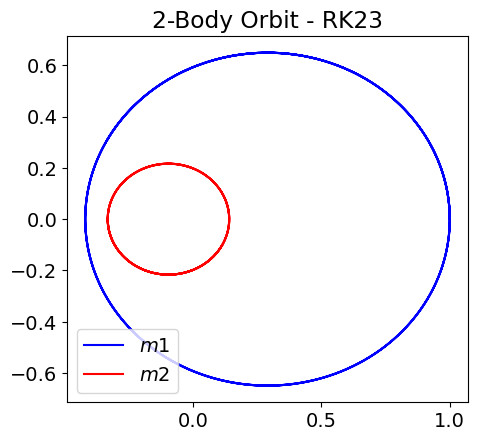

In [6]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

G = 1.
m1 = 1.
m2 = 3.

#Instantiate orbits
o1 = Orbit(m1, m2, G)

# Initial conditions with CoM velocity = 0
x1_0, xd1_0 = 1., 0.
y1_0, yd1_0 = 0., 1.
x2_0, xd2_0 = -(m1/m2) * x1_0, -(m1/m2) * xd1_0
y2_0, yd2_0 = -(m1/m2) * y1_0, -(m1/m2) * yd1_0

z_0 = [x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0]
x1, xd1, y1, yd1, x2, xd2, y2, yd2 = o1.solve_ode(t_pts,z_0)

#Start plot
fig = plt.figure(figsize=(5,5))

#First plot - orbit
ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x1, y1, color='blue', label=r'$m1$')
ax.plot(x2, y2, color='red', label=r'$m2$')
ax.set_title('2-Body Orbit - RK23')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()
fig.savefig('Leapfrog_orbits_final.png', bbox_inches='tight')

This is a simple orbital plot using the RK23 method to solve the differential equations. Here, $G = 1$, $m_1 = 1$, and $m_2 = 3$.

In [7]:
%%capture

x_min = -0.5
x_max = 1.2
y_min = -0.7
y_max = -y_min

fig_anim = plt.figure(figsize=(5,3), num='Orbits 1')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
ln1_anim, = ax_anim.plot(x1, y1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x2, y2, color='red', lw=1)

pt1_anim, = ax_anim.plot(x1[0], y1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x2[0], y2[0], 'o', markersize=8, color='red')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()


In [8]:
def animate_orbits(i):
    """
    FuncAnimation frame indexer
    """
    i_skip = 1 * i
    
    pt1_anim.set_data(x1[i_skip], y1[i_skip])
    pt2_anim.set_data(x2[i_skip], y2[i_skip])
    
    return (pt1_anim, pt2_anim)


In [9]:
frame_interval = 10.
frame_number = 301
anim = animation.FuncAnimation(fig_anim, 
                               animate_orbits, 
                               init_func=None, 
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True, 
                               repeat=False)

In [10]:
HTML(anim.to_jshtml())

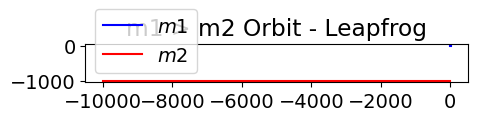

In [11]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

G = 1.
m1 = 1000.
m2 = 1.

#Instantiate orbits
o1 = Orbit(m1, m2, G)

# Initial conditions with CoM velocity = 0
x1_0, xd1_0 = 0., 1.
y1_0, yd1_0 = 1., 0.
x2_0, xd2_0 = -(m1/m2) * x1_0, -(m1/m2) * xd1_0
y2_0, yd2_0 = -(m1/m2) * y1_0, -(m1/m2) * yd1_0

z_0 = [x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0]
x1, xd1, y1, yd1, x2, xd2, y2, yd2 = o1.solve_ode_Leapfrog(t_pts,z_0)

#Start plot
fig = plt.figure(figsize=(5,5))

#First plot - orbit
ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x1, y1, color='blue', label=r'$m1$')
ax.plot(x2, y2, color='red', label=r'$m2$')
ax.set_title('m1 > m2 Orbit - Leapfrog')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()
fig.savefig('RK23_orbits_Final.png', bbox_inches='tight')

This plot again shows a 2-body orbital path, but uses the Leapfrog solver instead of RK23. Also, the values have changed to: $G$ = 1, $m_1$ = 1000, and $m_2$ = 1. The larger difference in masses shows the orbits reduce to $m_1$ being essentially stationary - as when $m_1$ >> $m_2$, the reduced mass $\mu = \large\frac{m_1m_2}{M}\normalsize\equiv\large\frac{m_1m_2}{m_1+m_2}$ becomes much closer to the ligher mass $m_2$, and the CoM frame becomes close to the larger particle $m_1$, which appears stationary.

In [12]:
%%capture

x_min = -10000.
x_max = 10.
y_min = -1000.
y_max = -10

fig_anim = plt.figure(figsize=(5,3), num='Orbits 1')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
ln1_anim, = ax_anim.plot(x1, y1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x2, y2, color='red', lw=1)

pt1_anim, = ax_anim.plot(x1[0], y1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x2[0], y2[0], 'o', markersize=8, color='red')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [13]:
def animate_orbits(i):
    """
    FuncAnimation frame indexer
    """
    i_skip = 1 * i
    
    pt1_anim.set_data(x1[i_skip], y1[i_skip])
    pt2_anim.set_data(x2[i_skip], y2[i_skip])
    
    return (pt1_anim, pt2_anim)

In [14]:
frame_interval = 5.
frame_number = 701
anim = animation.FuncAnimation(fig_anim, 
                               animate_orbits, 
                               init_func=None, 
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True, 
                               repeat=False)

In [15]:
HTML(anim.to_jshtml())

## Attempt at 3-body Orbital Plot and Animation

In [16]:
class Orbit3b:
    """
    Class to implement parameters and solve Lagrange's equations for two orbiting particles under gravity.
    
    Parameters
    ----------
    m1, m2, m3: float
    Masses of planets/particles
    
    G: float
    Gravitational constant
    
    Methods
    -------
    dz_dt(t, z)
    Returns rhs of diffeq in vector y, given time t and corresponding y-value.
    """
    
    def __init__(self, m1=1., m2=1., m3=1., G=1.):
        """
        This function initializes the masses of 3 planets (m1, m2, m3) and a gravitational constant (G).
        """
        self.m1 = m1
        self.m2 = m2
        self.m3 = m3
        self.G = G
        
    def dz_dt(self, t, z):
        """
        This function returns the rhs of the diffeq:
        [dz/dt d^2z/dt^2]
        """
        x1, xd1, y1, yd1, x2, xd2, y2, yd2, x3, xd3, y3, yd3 = z
        
        r_12 = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
        r_23 = np.sqrt((x2 - x3)**2 + (y2 - y3)**2)
        r_13 = np.sqrt((x1 - x3)**2 + (y1 - y3)**2)
        return [ \
                xd1, self.G * self.m2 * (x2-x1) / r_12**3 + self.G * self.m3 * (x3-x1) / r_13**3, \
                yd1, self.G * self.m2 * (y2-y1) / r_12**3 + self.G * self.m3 * (y3-y1) / r_13**3, \
                xd2, self.G * self.m1 * (x1-x2) / r_12**3 + self.G * self.m3 * (x3-x2) / r_23**3, \
                yd2, self.G * self.m1 * (y1-y2) / r_12**3 + self.G * self.m3 * (y3-y2) / r_23**3, \
                xd3, self.G * self.m1 * (x1-x3) / r_13**3 + self.G * self.m2 * (x2-x3) / r_23**3, \
                yd3, self.G * self.m1 * (y1-y3) / r_13**3 + self.G * self.m2 * (y2-y3) / r_23**3, \
               ]
    
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
        
#        0   1   2    3   4    5   6    7   8    9   10   11
        x1, xd1, y1, yd1, x2, xd2, y2, yd2, x3, xd3, y3, yd3 = solution.y
        return x1, xd1, y1, yd1, x2, xd2, y2, yd2, x3, xd3, y3, yd3


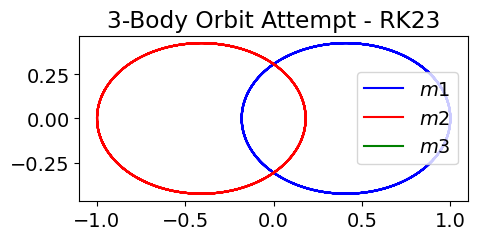

In [17]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

G = 1.
m1 = 1.
m2 = 1.
m3 = 3.

#Instantiate orbits
o3 = Orbit3b(m1, m2, m3, G)

# Initial conditions with CoM velocity = 0
x1_0, xd1_0 = 1., 0.
y1_0, yd1_0 = 0., 1.
x2_0, xd2_0 = -(m1/m2) * x1_0, -(m1/m2) * xd1_0
y2_0, yd2_0 = -(m1/m2) * y1_0, -(m1/m2) * yd1_0
x3_0, xd3_0 = -(m1/m3) * x1_0 - (m2/m3) * x2_0, -(m1/m3) * xd1_0 - (m2/m3) * xd2_0
y3_0, yd3_0 = -(m1/m3) * y1_0 - (m2/m3) * y2_0, -(m1/m3) * yd1_0 - (m2/m3) * yd2_0

z_0 = [x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0, x3_0, xd3_0, y3_0, yd3_0]

x1, xd1, y1, yd1, x2, xd2, y2, yd2, x3, xd3, y3, yd3 = o3.solve_ode(t_pts, z_0)

#Start plot
fig = plt.figure(figsize=(5,5))

#First plot - orbit
ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x1, y1, color='blue', label=r'$m1$')
ax.plot(x2, y2, color='red', label=r'$m2$')
ax.plot(x3, y3, color='green', label=r'$m3$')
ax.set_title('3-Body Orbit Attempt - RK23')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()
fig.savefig('3-body-orbit-attempt.png', bbox_inches='tight')

This plot shows why this section is more of an "attempt" - there are 2 closed orbit paths for $m_1$ and $m_2$, but $m_3$ is stationary, and therefore does not appear on this plot. However, $m_3$ does appear as a point on the animation below.

In [18]:
%%capture

x_min = -1.2
x_max = -x_min
y_min = -0.5
y_max = -y_min

fig_anim = plt.figure(figsize=(5,3), num='Orbits 1')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
ln1_anim, = ax_anim.plot(x1, y1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x2, y2, color='red', lw=1)
ln3_anim, = ax_anim.plot(x3, y3, color='green', lw=1)

pt1_anim, = ax_anim.plot(x1[0], y1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x2[0], y2[0], 'o', markersize=8, color='red')
pt3_anim, = ax_anim.plot(x3[0], y3[0], 'o', markersize=8, color='green')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [19]:
def animate_orbits(i):
    """
    FuncAnimation frame indexer
    """
    i_skip = 1 * i
    
    pt1_anim.set_data(x1[i_skip], y1[i_skip])
    pt2_anim.set_data(x2[i_skip], y2[i_skip])
    pt3_anim.set_data(x3[i_skip], y3[i_skip])
    
    return (pt1_anim, pt2_anim, pt3_anim)

In [20]:
frame_interval = 10.
frame_number = 401
anim = animation.FuncAnimation(fig_anim, 
                               animate_orbits, 
                               init_func=None, 
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True, 
                               repeat=False)

In [21]:
HTML(anim.to_jshtml())